In [16]:
from sklearn.decomposition import PCA

## Modules for modulating systems
import os
os.environ['PROJ_LIB'] = '/Users/mb/anaconda3/envs/worklab/share/proj'
import warnings
warnings.filterwarnings('ignore')

## Modules for Calculation
import numpy    as np
import xarray   as xr
import netCDF4 
import pandas   as pd

## Modules for caculating statistics
from scipy   import stats, signal
from sklearn import linear_model

## Modules for plottings
import matplotlib.pyplot as plt 
import matplotlib.colorbar as cb
from mpl_toolkits.basemap import Basemap, shiftgrid

plt.rcParams['figure.dpi'] = 300
%config InlineBackend.figure_format = 'retina'

## Modules for modulating systems
import os
import warnings
warnings.filterwarnings('ignore')


## read anomaly data

In [17]:
f = xr.open_dataset("C:\\Users\\judyg\\Desktop\\CSL\\CO2\\(2) SST anomaly.nc")
A = f["aSST"] #CO2

lon =  f["longitude"].values
lat =  f["latitude"].values
time = f["time"].values

feature = "SST"

print(os.getcwd())

C:\Users\judyg\Desktop\CSL\EOF


In [18]:
## Specify the range of lat, lon and time of SST data
latS = -90.      ;   latN = 90.
lonL = 0.        ;   lonR = 360.
yr_str = 2003   ;   yr_end = 2020
n_yr = yr_end - yr_str +1

### conduct the EOF & PCA Decomposition

#### Empirical Orthogonal Functions & Principal Component Analysis

In [19]:
N_comp = 5 ##the number of PC (principal component)

## conduct the EOF & PCA Decomposition
pca = PCA(n_components=N_comp)

arr = np.array(A)
A_re = arr.reshape(arr.shape[0], (arr.shape[1]*arr.shape[2]))

pca.fit(A_re)

TS_pc = pca.fit_transform(A_re)        ## time-series of PCs
VAR_pc = pca.explained_variance_ratio_  ## variances for PCs
SP_pc = pca.components_                 ## Spatial ptterns for PCs

print(TS_pc.shape)

A_ts = TS_pc
A_sp = SP_pc.reshape(5,arr.shape[1],arr.shape[2])



print(A_ts)
print(VAR_pc)

A_sp.shape


(215, 5)
[[-133.55539     43.070004     7.0344677    6.9654164   13.99158  ]
 [-151.89812     51.480927    -6.8590555    6.7297764   19.515469 ]
 [-154.82098     41.913017   -17.146502    -5.9888544   14.144606 ]
 ...
 [-126.816444   -58.206577    45.52033     23.07437     55.70621  ]
 [-137.87892    -18.894854    40.535797    26.882376    31.48807  ]
 [-142.74815     10.900604    22.298693    37.938324    35.713158 ]]
[0.75104254 0.06159205 0.03315836 0.01978049 0.01691918]


(5, 241, 480)

(215,)
(215,)
(215,)


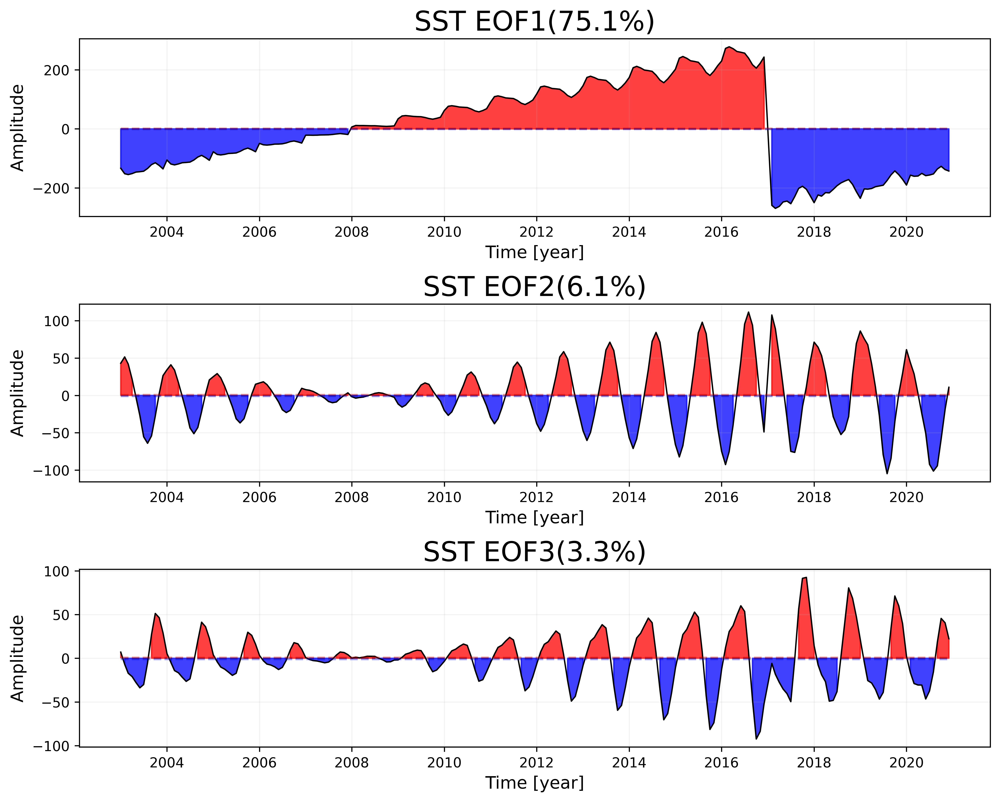

In [20]:
#A_latlonf = A.mean(axis=(1,2))
##############
title = ["SST EOF1(75.1%)","SST EOF2(6.1%)","SST EOF3(3.3%)"]
fig, axes = plt.subplots(3,1,figsize=(10,8),constrained_layout = True)

for k in range(3):
    index = A_ts[:,k]
    time = A.time
    print(index.shape)

    axe=axes[k]
    
    ## Plot Time Series & Reference line (1 sigma)
    axe.plot(time, index ,linewidth=1,color='k',label='CO2 anomaly')
    axe.plot(time, np.zeros(len(time)),  '--',linewidth=1.5,color='k',alpha=0.3)
    axe.plot(time, 1*np.ones(len(time)), '--',linewidth=1.5,color='r',alpha=0.3,label='$1\Sigma$')
    axe.plot(time, -1*np.ones(len(time)),'--',linewidth=1.5,color='b',alpha=0.3,label='$-1\Sigma$')

    ## Fill positive as red and negative as blue
    axe.fill_between(time, index, 0, where = (index > 0), color='red', alpha=0.75)
    axe.fill_between(time, index, 0, where = (index < 0), color='blue',alpha=0.75)

    ## Detail plot properties
    axe.set_xlabel("Time [year]",fontsize=12.5)
    axe.set_ylabel("Amplitude",fontsize=12.5)
    axe.grid(alpha=0.15)
    axes[k].set_title(title[k],fontsize=20)
#axes[0].set_title("CO2 EOF1(89.1%)",fontsize=20)
#axes[1].set_title("CO2 EOF2(2.7%)",fontsize=20)
#axes[2].set_title("CO2 EOF3(1.9%)",fontsize=20)
    
## <Save Time Series Figure to RESULT directory
dir_name   =  "C:\\Users\\judyg\\Desktop\\CSL\\EOF\\"
file_name  =  "(1) EOF " +str(feature)+ " line.pdf"
path_name  =  dir_name+file_name
plt.savefig(path_name)

#### map

In [21]:
fig, axes = plt.subplots(3, 1, figsize=(10,15), constrained_layout = True )


for k in range(3):
    index_m = A_sp[k]
    cmap         = plt.get_cmap('RdBu_r')
    lon0         = -180
    
    m = plt.subplot(3,1,k+1)
    ## Plot correlation contour map
    m = Basemap(projection = 'cyl', lon_0 = lon0, resolution = 'c')
    m.fillcontinents(color = 'grey',lake_color = 'grey', alpha = 0.3)
    m.drawcoastlines(linewidth = 0.25)
    m.drawmapboundary(fill_color = 'white')
    m.drawparallels(np.arange(-90.,90.,30.),labels = [1,0,0,0], color = 'grey',linewidth=0.25)
    m.drawmeridians(np.arange(0.,360.,60.),labels = [0,0,0,1], color = 'grey',linewidth=0.25)

    contour_shifted, lon_shifted = shiftgrid(180+lon0, index_m, lon, start = False, cyclic=360)
    lon_new, lat_new = np.meshgrid(lon_shifted,lat)
    x, y = m(lon_new,lat_new)
    vmin = -0.005 ; vmax = 0.005
    nv = 30; levels = np.linspace(vmin,vmax,nv+1)
    plot = m.contourf(x, y, contour_shifted, cmap = cmap, levels = levels, extend = 'both')
    plt.title(title[k],fontsize=12)
    
## Detail plot properties    
plt.subplot(3,1,1)

cbar = m.colorbar(plot, aspect = 35, pad = 0.2)
cbar.set_ticks([-0.005,-0.0025,0.0,0.0025,0.005])
cbar.ax.tick_params( length = 5, labelsize = 10)

fig.suptitle("EOF & PCA " +str(feature),fontsize=18)
fig.tight_layout()

## <Save Correaltion Map Figure to RESULT directory
dir_name   =  'C:\\Users\\judyg\\Desktop\\CSL\\EOF\\'
file_name  =  "(1) EOF " +str(feature)+" map.pdf"
path_name  =  dir_name+file_name
plt.savefig(path_name)
